Результат

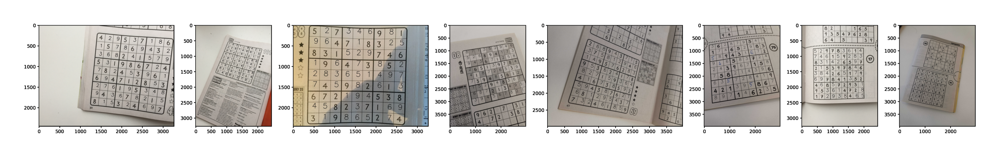

In [63]:
from matplotlib import pyplot as plt
import cv2
final_frame=cv2.imread('/content/1.png')
for i in range (2, 9):
  im=cv2.imread('/content/'+str(i)+'.png')
  final_frame=cv2.hconcat((final_frame, im))

plt.figure(dpi=700)
plt.imshow(final_frame)
plt.axis('off')
plt.show()

# Старый код (ищет маску и цифры)

In [1]:
# -*- coding: utf-8 -*-
"""Сдача.ipynb

Automatically generated by Colaboratory.

Original file is located at
    https://colab.research.google.com/drive/1502lVX1KrMX49yOn8oz7Sa3V_QwVxErr
"""

import joblib

import numpy as np
from numpy import logical_and as land
from numpy import logical_not as lnot
from skimage.feature import canny
from skimage.transform import rescale, ProjectiveTransform, warp
from skimage.morphology import dilation, disk
import cv2
import operator
from tensorflow import keras

SCALE = 0.33

def mask(img):
      lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
      l_channel, a, b = cv2.split(lab)
      clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(10,10))
      cl = clahe.apply(l_channel)
      limg = cv2.merge((cl,a,b))
      enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
      gray = cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2GRAY)

      proc = cv2.GaussianBlur(gray.copy(), (9, 9), 0)
      proc = cv2.adaptiveThreshold(proc, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
      proc = cv2.bitwise_not(proc, proc)
      kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], dtype=np.uint8) 
      proc = cv2.dilate(proc, kernel)

      img_cnt = img.copy()

      contours, h = cv2.findContours(proc.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  
      areas=[]
      for  cnt in contours:
        areas.append([cv2.contourArea(cnt), cnt])

      areas.sort(key=lambda x:x[0],reverse=True)
      
      sudoku=[areas[0]]
      for i in range(2, len(areas)):
        if (areas[i][0]>0):
          if (areas[i][0]/areas[1][0]>=0.85): sudoku.append(areas[i])
          else: break
      
      contours=[]
      for i in range(len(sudoku)): contours.append(sudoku[i][1])
      
      img_cnt[:] = (0, 0, 0)
      cv2.fillPoly(img_cnt, pts =contours, color=(255,255,255))
      img_cnt=cv2.cvtColor(img_cnt, cv2.COLOR_BGR2GRAY)
      return img_cnt, contours
def crop(img, contour):
        def en(a=1): 
          return enumerate([pt[0][0]+a*pt[0][1] for pt in contour])
        def dist(p1, p2): 
          return np.sqrt(((p2[0] - p1[0]) ** 2) + ((p2[1] - p1[1]) ** 2))  
        
        tl=contour[min(en(1), key=operator.itemgetter(1))[0]][0]
        tr=contour[max(en(-1), key=operator.itemgetter(1))[0]][0]
        br=contour[max(en(1), key=operator.itemgetter(1))[0]][0]
        bl=contour[min(en(-1), key=operator.itemgetter(1))[0]][0]
        
        src = np.array([tl, tr, br, bl], dtype='float32')

        side = max([ dist(br, tr), dist(tl, bl), dist(br, bl), dist(tl, tr)])

        dst = np.array([[0, 0], 
                        [side - 1, 0], 
                        [side - 1, side - 1], 
                        [0, side - 1]], dtype='float32')
        m = cv2.getPerspectiveTransform(src, dst)
        return cv2.warpPerspective(img, m, (int(side), int(side)))
def scale(img, size):
    h, w = img.shape[:2]

    def centre_pad(length): return int((size - length) / 2), int((size - length) / 2)+1*(length % 2 != 0)
       
    ratio = (size-4) / max(h, w)
    w, h = int(ratio*w), int(ratio*h)
    img = cv2.resize(img, (w, h))
    if h > w:    
        l_pad, r_pad = centre_pad(w)
        img = cv2.copyMakeBorder(img, 2, 2, l_pad, r_pad, cv2.BORDER_CONSTANT, None, 0)
    else:
        t_pad, b_pad = centre_pad(h)
        img = cv2.copyMakeBorder(img, t_pad, b_pad, 2, 2, cv2.BORDER_CONSTANT, None, 0)

    
    return cv2.resize(img, (size, size))
def find_largest_feature(inp_img, scan_tl, scan_br):
    img = inp_img.copy()
    height, width = img.shape[:2]
    max_area = 0
    seed_point = (None, None)
    for x in range(scan_tl[0], scan_br[0]):
        for y in range(scan_tl[1], scan_br[1]):
            if img.item(y, x) == 255 and x < width and y < height:
                area = cv2.floodFill(img, None, (x, y), 64)
                if area[0] > max_area:
                    max_area = area[0]
                    seed_point = (x, y)
    for x in range(width):
        for y in range(height):
            if img.item(y, x) == 255 and x < width and y < height: 
                cv2.floodFill(img, None, (x, y), 64)

    mask = np.zeros((height + 2, width + 2), np.uint8)

    if all([p is not None for p in seed_point]):
        cv2.floodFill(img, mask, seed_point, 255)

    top, bottom, left, right = height, 0, width, 0

    for x in range(width):
        for y in range(height):
            if img.item(y, x) == 64:
                cv2.floodFill(img, mask, (x, y), 0)

            if img.item(y, x) == 255:
                top = y if y < top else top
                bottom = y if y > bottom else bottom
                left = x if x < left else left
                right = x if x > right else right

    bbox = [[left, top], [right, bottom]]
    return img, np.array(bbox, dtype='float32'), seed_point
def extract_digit(img, rect, size):
    
    digit = img[int(rect[0][1]):int(rect[1][1]), int(rect[0][0]):int(rect[1][0])]
    h, w = digit.shape[:2]
    margin = int(np.mean([h, w]) / 2.5)
    bbox= find_largest_feature(digit, [margin, margin], [w - margin, h - margin])[1]
    digit = digit[int(bbox[0][1]):int(bbox[1][1]), int(bbox[0][0]):int(bbox[1][0])]
    w = bbox[1][0] - bbox[0][0]
    h = bbox[1][1] - bbox[0][1]
    if w > 0 and h > 0 and (w * h) > 100 and len(digit) > 0: return scale(digit, size)
    else: return np.zeros((size, size), np.uint8)
def get_digits(img, squares, size):
    digits = []
    img_copy=img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    proc = cv2.GaussianBlur(img.copy(), (9, 9), 0)
    proc = cv2.adaptiveThreshold(proc, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    proc = cv2.bitwise_not(proc, proc)
    for square in squares:
        digits.append(extract_digit(proc, square, size))
    return digits
def one_digit(img, m):
        side_y=img.shape[0]/9
        side_x=img.shape[1]/9
        image=[]
        for i in range(9):
            for j in range(9):
                image.append(img[int(side_x*i):int(side_x*(i+1)), int(side_y*j):int(side_y*(j+1))])
        return image[m]

def preprocess_table(table):
    x= []
    side = table.shape[:1][0]/9
    for j in range(9):
        for i in range(9):
            x.append(((i * side, j * side), ((i + 1) * side, (j + 1) * side)))
    
    digits = get_digits(table, x, 28)
    rows = []
    with_border = [cv2.copyMakeBorder(z.copy(), 1, 1, 1, 1, cv2.BORDER_CONSTANT, None, 255) for z in digits]
    for i in range(9):
        row = np.concatenate(with_border[i * 9:((i + 1) * 9)], axis=1)
        rows.append(row)
    return np.concatenate(rows)
    
def digits_answer(proc, clf):
    sudoku_digits=[]
    for i in range(81):
      digit_img=one_digit(proc, i)
      image = digit_img[1:29,1:29]
      image = cv2.resize(image, (28,28))
      kernel = np.ones((2,2))
      image = cv2.dilate(image, kernel, iterations=2)
      image = cv2.erode(image, kernel, iterations=2)
      # print(image.sum())
      if image.sum() > 10000:
          features_test = np.array([image.ravel()])
          sudoku_digit= clf.predict(features_test)
          sudoku_digits.append(sudoku_digit[0])
      else:
          
          sudoku_digits.append(-1)
      
    sudoku_digits=np.array(sudoku_digits)
    return sudoku_digits.reshape(9, 9)

def predict_image(image):
    img_cnt, contours=mask(image)
    mask_pred = img_cnt
    
    
    cropped=crop(image, contours[0])
    
    clf = joblib.load('/content/model.joblib')
    proc=preprocess_table(cropped)
    sudoku_digits = [np.int16(digits_answer(proc, clf))]
   
    return mask_pred, sudoku_digits

# Код с гитхаба (не мой) для решения судоку (ссылка на который была в assignment)

In [3]:
from itertools import islice
from typing import Iterable, Union, Tuple

import numpy as np


def solve(field: Union[str, np.ndarray, list, tuple], cell_shape: Tuple[int, int] = None) -> Iterable[np.ndarray]:
    """
    Solves a sudoku puzzle and yields all possible solutions.
    Parameters
    ----------
    field
        if array - nan values denote unfilled positions, if str - '?' denotes unfilled positions
    cell_shape
        the shape of a single cell (e.g. simple sudoku = (3, 3) ), supports non-square cells.
        if None - the shape is considered square and is inferred from field's shape
    """
    if isinstance(field, str):
        field, initial, cell_shape = parse_text(field, cell_shape)
    else:
        field, initial, cell_shape = parse_array(field, cell_shape)

    for v in initial:
        propagate_constraints(field, *v, cell_shape)
    return make_suggestions(field, cell_shape)


class NotSolvable(ValueError):
    pass


def propagate_constraints(field, i, j, value, cell_shape):
    mask = field[..., value]
    update_at = np.zeros_like(mask)

    # rows, cols
    update_at[i] = 1
    update_at[:, j] = 1

    # cell
    start = (np.array((i, j)) // cell_shape) * cell_shape
    stop = start + cell_shape
    update_at[tuple(map(slice, start, stop))] = 1

    # except
    update_at[i, j] = 0

    # only where should remove
    update_at = update_at & mask
    mask[update_at] = 0

    if not field.any(-1).all():
        # no possible values
        raise NotSolvable

    # propagate
    update_at = update_at & (field.sum(-1) == 1)
    xs, ys = np.where(update_at)
    for i, j in zip(xs, ys):
        unique_value, = np.where(field[i, j])[0]
        propagate_constraints(field, i, j, unique_value, cell_shape)


def is_solved(field):
    return (field.sum(-1) == 1).all()


def make_suggestions(field, cell_shape):
    if is_solved(field):
        values = np.where(field)[2] + 1
        yield values.reshape(*field.shape[:2])
        return

    variants = field.sum(-1).astype(float)
    variants[variants == 1] = np.inf
    idx = np.argmin(variants)
    i, j = np.unravel_index(idx, field.shape[:2])

    for value in range(len(field)):
        if field[i, j, value]:
            suggestion = field.copy()
            # suppose that the real value at (i,j) is `value`
            suggestion[i, j] = 0
            suggestion[i, j, value] = 1

            try:
                propagate_constraints(suggestion, i, j, value, cell_shape)
                yield from make_suggestions(suggestion, cell_shape)
            except NotSolvable:
                pass


def get_cell_shape(field_side, cell_shape):
    if cell_shape is None:
        cell_side = int(np.sqrt(field_side))
        assert cell_side ** 2 == field_side
        cell_shape = np.array((cell_side, cell_side), int)

    cell_size = np.prod(cell_shape)
    assert field_side == cell_size
    return cell_shape, cell_size


def parse_text(text: str, cell_shape):
    values = text.split()
    field_side = int(np.sqrt(len(values)))
    if len(values) != field_side ** 2:
        raise ValueError('The field is not square.')

    cell_shape, cell_size = get_cell_shape(field_side, cell_shape)
    field = np.ones([field_side] * 3, dtype=bool)

    initial = []
    for i, value in enumerate(values):
        if value != '?':
            value = int(value)
            assert 0 < value <= cell_size, value

            i, j = np.unravel_index(i, field.shape[:2])
            value -= 1
            field[i, j] = 0
            field[i, j, value] = 1
            initial.append((i, j, value))

    return field, initial, cell_shape


def parse_array(array: np.ndarray, cell_shape):
    array = np.asarray(array, float)
    field_side = len(array)
    if array.ndim != 2 or field_side != array.shape[1]:
        raise ValueError('The field is not square.')

    cell_shape, cell_size = get_cell_shape(field_side, cell_shape)
    field = np.ones([field_side] * 3, dtype=bool)
    not_empty = ~np.isnan(array)

    initial = []
    for i, j in zip(*not_empty.nonzero()):
        value = int(array[i, j])
        assert 0 < value <= cell_size

        value -= 1
        field[i, j] = 0
        field[i, j, value] = 1
        initial.append((i, j, value))

    return field, initial, cell_shape


def print_field(field: np.ndarray, cell_shape: Tuple[int, int] = None):
    cell_shape, cell_size = get_cell_shape(len(field), cell_shape)
    h, w = cell_shape
    number_width = int(np.log10(cell_size - 1)) + 1
    result_width = cell_size * (number_width + 1) + 2 * cell_size // w + 1

    for i, row in enumerate(field):
        if i % h == 0:
            print('-' * result_width)

        for j, value in enumerate(row):
            value = str(value).ljust(number_width + 1, ' ')

            if j % w == 0:
                print('| ', end='')
            print(value, end='')
        print('|')
    print('-' * result_width)


def print_solutions(text: str, cell_shape: Tuple[int, int] = None, max_solutions: int = None):
    solutions = solve(text, cell_shape)
    if max_solutions is not None:
        solutions = islice(solutions, max_solutions)

    for solution in solutions:
        print_field(solution, cell_shape)
        print()

# Цифры на картинке (чистовик)

Чтобы исполнять этот код необходим файл model.joblib (подтягивает цифры из старого решения).

In [6]:
from matplotlib import pyplot as plt

def anti_crop(img, contour, cropped):
        def en(a=1): 
          return enumerate([pt[0][0]+a*pt[0][1] for pt in contour])
        def dist(p1, p2): 
          return np.sqrt(((p2[0] - p1[0]) ** 2) + ((p2[1] - p1[1]) ** 2))  
        
        tl=contour[min(en(1), key=operator.itemgetter(1))[0]][0]
        tr=contour[max(en(-1), key=operator.itemgetter(1))[0]][0]
        br=contour[max(en(1), key=operator.itemgetter(1))[0]][0]
        bl=contour[min(en(-1), key=operator.itemgetter(1))[0]][0]
        
        src = np.array([tl, tr, br, bl], dtype='float32')

        side = max([ dist(br, tr), dist(tl, bl), dist(br, bl), dist(tl, tr)])
        
        dst = np.array([[0, 0], 
                        [side - 1, 0], 
                        [side - 1, side - 1], 
                        [0, side - 1]], dtype='float32')
        m = cv2.getPerspectiveTransform(dst, src)
        result=cv2.warpPerspective(cropped, m, (int(img.shape[1]), int(img.shape[0])))
        for i in range(img.shape[0]-10):
          for j in range(img.shape[1]-10):
            if (result[i][j]==[0, 0, 0]).all(): result[i][j]=img[i][j]

        return result


def draw_digits(img, org=(60, 90), fontScale=3):
  x=predict_image(img)[1][0]
  temp=''
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      if x[i][j]!=-1:
          temp=temp+str(x[i][j])+' ' 
      else: 
          temp=temp+'?'+' ' 
    temp+='\n'
  y=next(solve(temp))
  img_cnt, contours=mask(img)
  cropped=crop(img, contours[0])
  m, n=int(cropped.shape[0]/9), int(cropped.shape[1]/9)
  font = cv2.FONT_HERSHEY_SIMPLEX
  # org = (60, 90)
  # fontScale = 3
  color = (1, 1, 1)
  thickness = 5

  for i in range (1, 10):
    for j in range (1, 10): 
      if (x[i-1][j-1]==-1):
          insert=y[i-1][j-1]
          digit=cropped[(i-1)*m:i*m, (j-1)*n:j*n]
          cropped[(i-1)*m:i*m, (j-1)*n:j*n] = cv2.putText(digit, str(insert), org, font, 
                        fontScale, color, thickness, cv2.LINE_AA)
  plt.figure(dpi=200)
  plt.imshow(anti_crop(img, contours[0], cropped))
  plt.show()
    


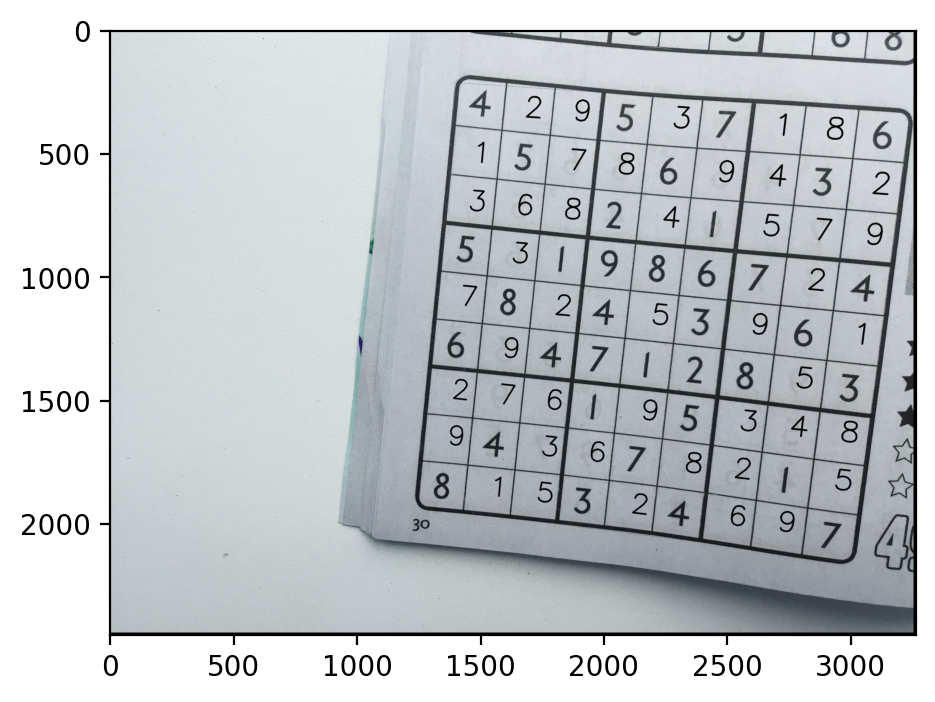

In [10]:
img = cv2.imread('/content/train_8.jpg')
draw_digits(img, (100, 120), 4)

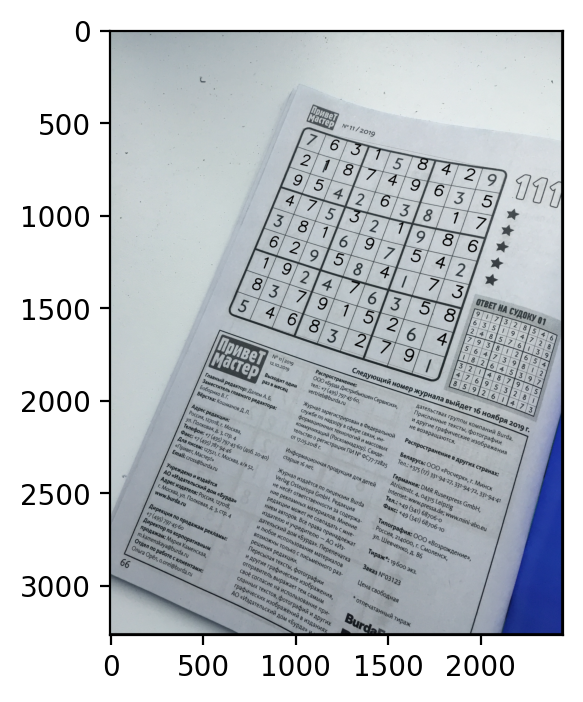

In [179]:
img = cv2.imread('/content/train_6.jpg')
draw_digits(img)

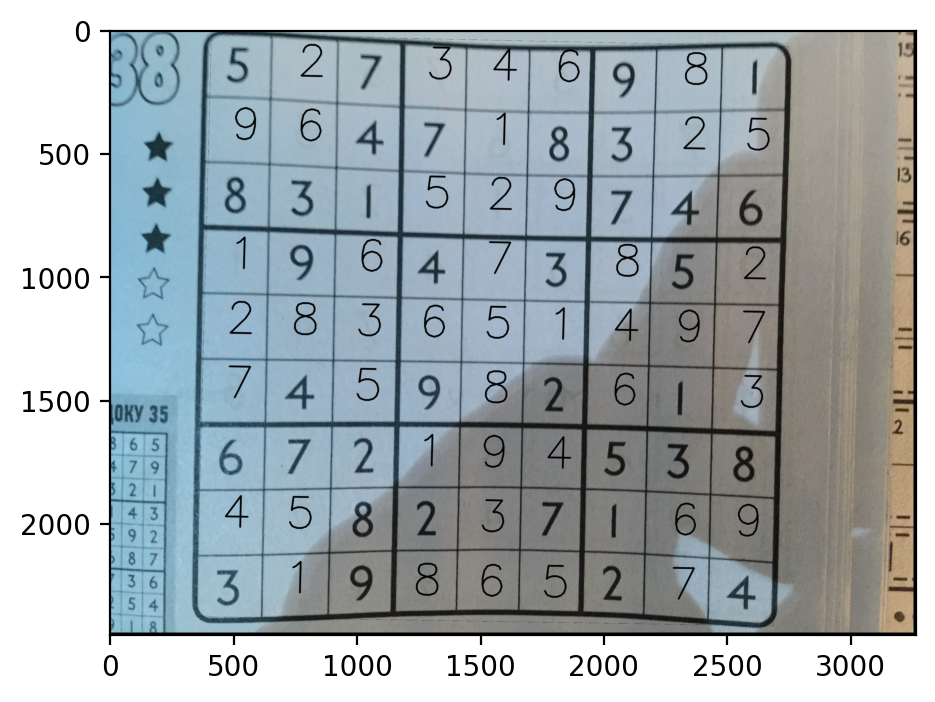

In [14]:
img = cv2.imread('/content/train_5.jpg')
draw_digits(img, (90, 160), 6)

Определитель цифр работает не на всех картинках со 100% accuracy, иногда есть погрешности и тогда solver не считает такую задачу корректной. Внизу приведены картинки для остальных судоку, но с заранее заданной сеткой цифр:

In [17]:
train_0=[[-1, -1, 5, -1, 3, -1, -1, -1, -1], [-1, -1, -1, 6, -1, 5, 1, 4, 3], [-1, -1, -1, -1, 4, 8, 7, -1, 2], [-1, -1, -1, -1, -1, 6, -1, -1, 8], [6, -1, -1, -1, -1, 2, 9, -1, 5], [9, -1, -1, 3, -1, 4, 2, -1, -1], [-1, -1, 9, 5, 6, -1, 8, 1, -1], [5, 6, -1, 1, -1, -1, -1, -1, -1], [-1, 8, -1, 4, -1, 7, 5, -1, -1]]
train_1=[[-1, -1, -1, -1, -1, -1, -1, -1, -1], [-1, -1, -1, 8, 9, 4, -1, -1, -1], [-1, -1, -1, 6, -1, 1, -1, -1, -1], [-1, 6, 5, 1, -1, 9, 7, 8, -1], [-1, 1, -1, -1, -1, -1, -1, 3, -1], [-1, 3, 9, 4, -1, 5, 6, 1, -1], [-1, -1, -1, 9, -1, 8, -1, -1, -1], [-1, -1, -1, 2, 1, 3, -1, -1, -1], [-1, -1, -1, -1, -1, -1, -1, -1, -1]]
train_2=[[1, 7, -1, -1, 8, 6, -1, -1, -1], [-1, 5, -1, 1, -1, -1, -1, 2, -1], [6, -1, -1, -1, 5, 2, -1, 7, -1], [-1, -1, -1, -1, 3, -1, 5, 9, -1], [2, -1, 8, -1, -1, -1, -1, 1, 4], [-1, 9, -1, -1, 7, 1, 6, 8, -1], [4, -1, 7, -1, -1, -1, 1, -1, 5], [-1, -1, 6, -1, -1, -1, 9, -1, -1], [-1, -1, -1, 7, -1, -1, -1, 6, -1]]
train_3=[[2, -1, -1, 9, -1, 3, -1, -1, 5], [-1, 7, -1, -1, -1, -1, -1, 4, -1], [-1, -1, 9, 5, -1, 6, 2, -1, -1], [9, -1, 3, -1, 2, -1, 1, -1, 8], [-1, -1, -1, 1, -1, 9, -1, -1, -1], [4, -1, 6, -1, 3, -1, 5, -1, 2], [-1, -1, 4, 3, -1, 7, 6, -1, -1], [-1, 8, -1, -1, -1, -1, -1, 3, -1], [7, -1, -1, 4, -1, 1, -1, -1, 9]]
train_4=[[-1, 6, -1, -1, -1, -1, 5, -1, -1], [1, -1, -1, 6, 5, -1, -1, 8, 3], [5, -1, 9, 4, 3, -1, 6, -1, 2], [-1, 1, -1, 5, -1, -1, 7, -1, -1], [-1, -1, 3, 9, -1, -1, 1, 5, -1], [-1, 5, 8, -1, -1, -1, -1, -1, 6], [-1, -1, 5, -1, -1, -1, -1, -1, 9], [4, 2, 1, -1, -1, 5, 8, 6, -1], [-1, -1, -1, 1, -1, 6, 2, -1, 5]]
train_7=[[-1, -1, 9, 7, 8, -1, -1, 1, -1], [-1, -1, -1, 1, -1, 9, -1, -1, -1], [8, -1, -1, -1, -1, 6, 5, -1, 7], [2, -1, 5, 3, 9, 7, 8, -1, 6], [-1, -1, -1, 2, 6, -1, 1, -1, 9], [-1, -1, 7, 8, 4, 1, -1, 5, 2], [4, -1, 8, -1, 7, 2, 9, 3, -1], [9, 5, -1, -1, -1, 4, 7, 2, -1], [1, 7, -1, -1, -1, -1, 4, -1, -1]]

In [15]:
def draw_digits_train(img, train_x, org = (65, 90), fontScale = 3):
  x=np.array(train_x)
  temp=''
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      if x[i][j]!=-1:
          temp=temp+str(x[i][j])+' ' 
      else: 
          temp=temp+'?'+' ' 
    temp+='\n'
  y=next(solve(temp))
  img_cnt, contours=mask(img)
  cropped=crop(img, contours[0])
  m, n=int(cropped.shape[0]/9), int(cropped.shape[1]/9)
  font = cv2.FONT_HERSHEY_SIMPLEX
  # org = (65, 90)
  # fontScale = 3
  color = (1, 1, 1)
  thickness = 5

  for i in range (1, 10):
    for j in range (1, 10): 
      if (x[i-1][j-1]==-1):
          insert=y[i-1][j-1]
          digit=cropped[(i-1)*m:i*m, (j-1)*n:j*n]
          cropped[(i-1)*m:i*m, (j-1)*n:j*n] = cv2.putText(digit, str(insert), org, font, 
                        fontScale, color, thickness, cv2.LINE_AA)
  plt.figure(dpi=200)
  plt.imshow(anti_crop(img, contours[0], cropped))
  plt.show()
    


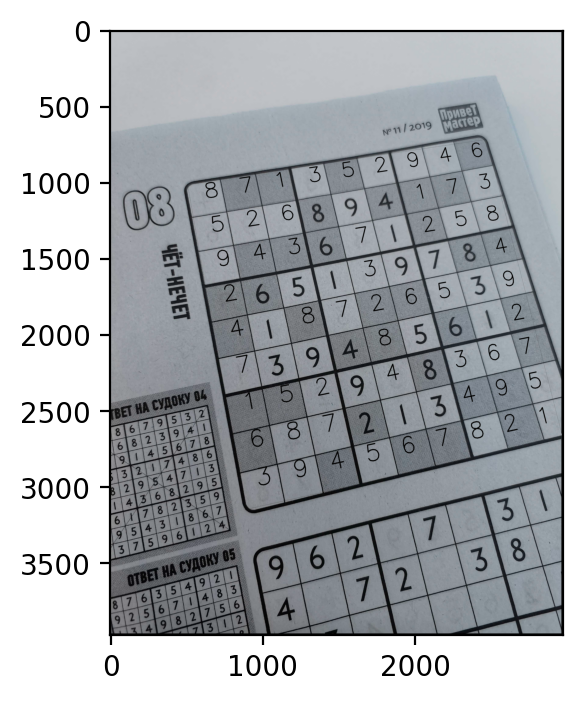

In [18]:
img = cv2.imread('/content/train_1.jpg')
draw_digits_train(img, train_1, (100, 120), 5)

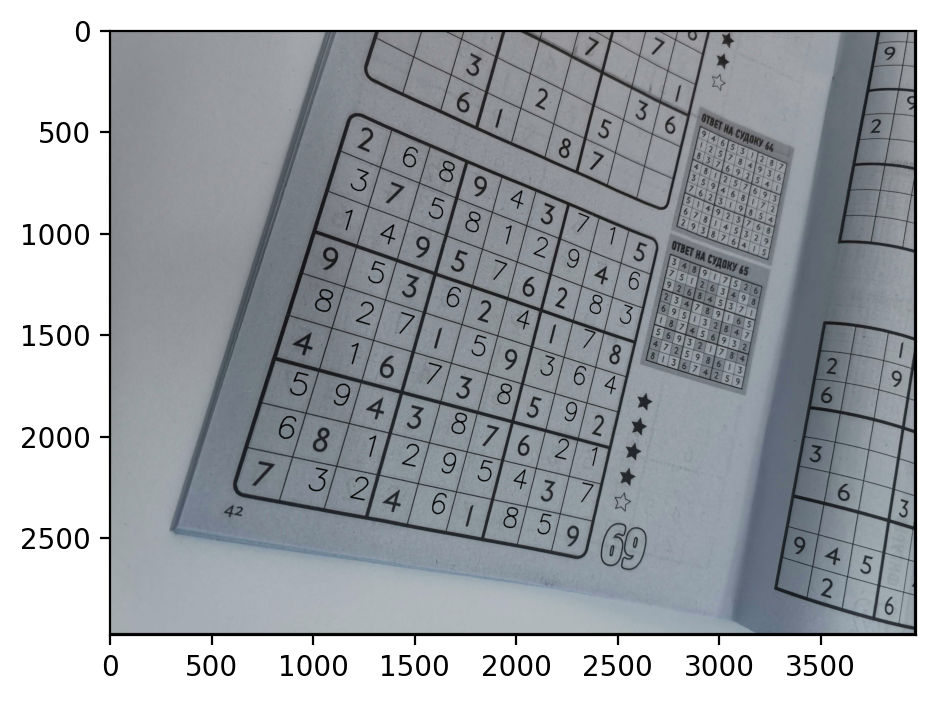

In [24]:
img = cv2.imread('/content/train_3.jpg')
draw_digits_train(img, train_3, (90, 140), 5)

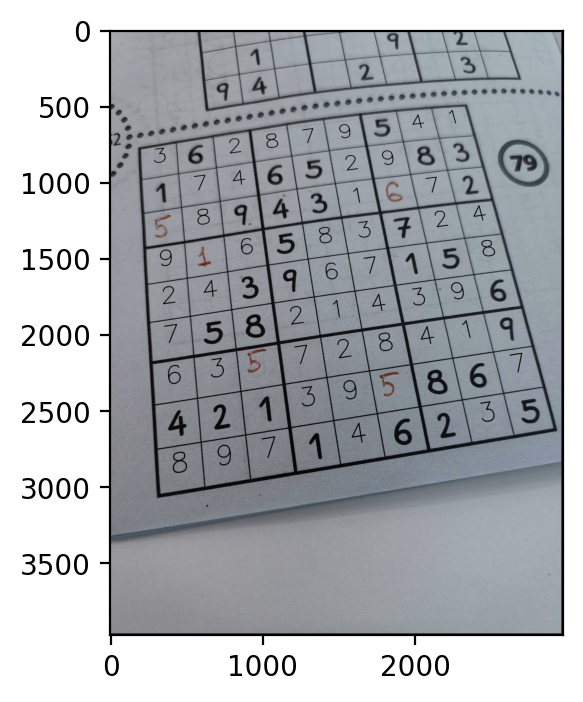

In [25]:
img = cv2.imread('/content/train_4.jpg')
draw_digits_train(img, train_4, (100, 160), 6)

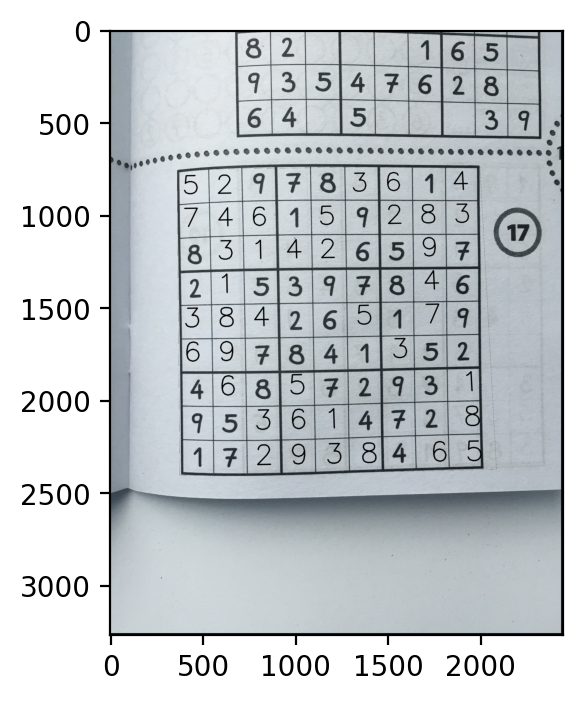

In [31]:
img = cv2.imread('/content/train_7.jpg')
draw_digits_train(img, train_7, (25, 140), 5)

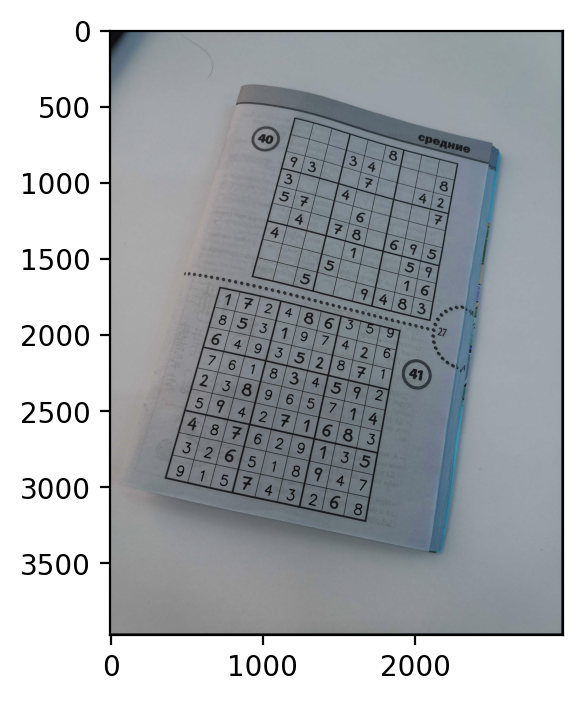

In [50]:
img = cv2.imread('/content/train_2.jpg')
draw_digits_train(img, train_2, (60, 120), 3)

На этой картинке сзади фон другого судоку отсвечивает, поэтому так:

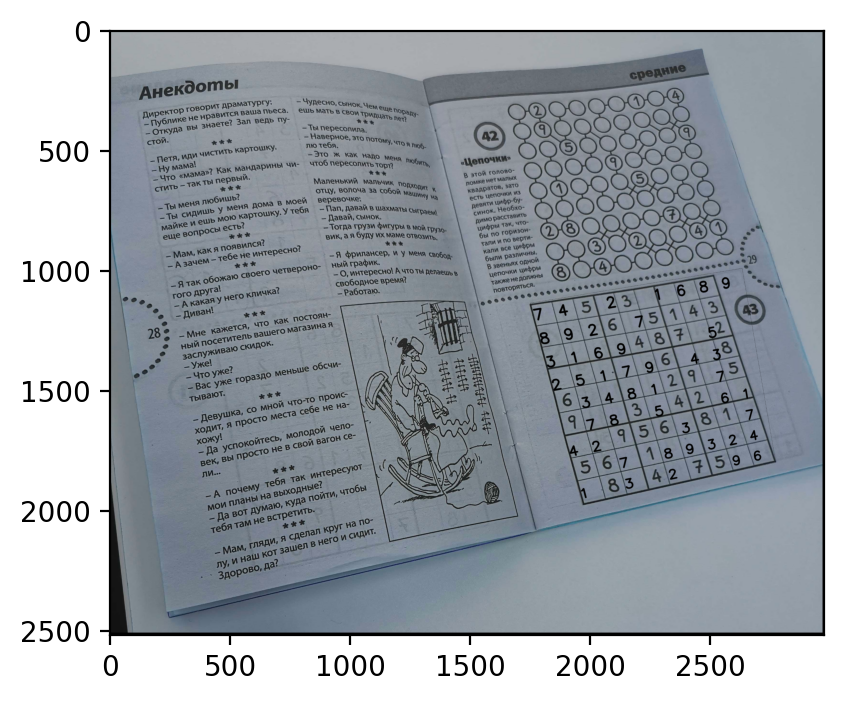

In [55]:
img = cv2.imread('/content/train_0.jpg')
draw_digits_train(img, train_0, (0, 70), 2)

# Рисуем цифры (черновик)

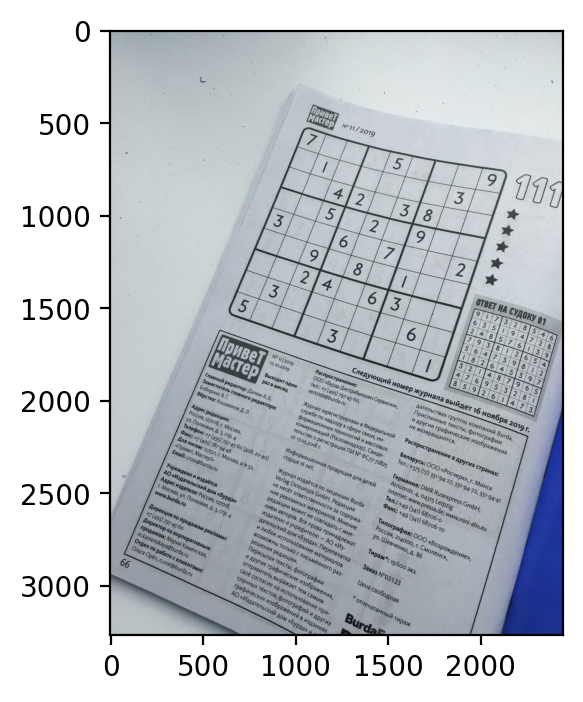

In [44]:
from matplotlib import pyplot as plt

img = cv2.imread('/content/train_6.jpg')

plt.figure(dpi=200)
plt.imshow(img)
plt.show()

In [45]:
print(predict_image(img)[1][0])

[[ 7 -1 -1 -1  5 -1 -1 -1  9]
 [-1 -1 -1 -1 -1 -1 -1  3 -1]
 [-1 -1  4  2 -1  3  8 -1 -1]
 [-1 -1  5 -1  2 -1  9 -1 -1]
 [ 3 -1 -1  6 -1  7 -1 -1  2]
 [-1 -1  9 -1  8 -1  1 -1 -1]
 [-1 -1  2  4 -1  6  3 -1 -1]
 [-1  3 -1 -1 -1 -1 -1  6 -1]
 [ 5 -1 -1 -1  3 -1 -1 -1  1]]


In [95]:
x=predict_image(img)[1][0]
temp=''
for i in range(x.shape[0]):
  for j in range(x.shape[1]):
    if x[i][j]!=-1:
        temp=temp+str(x[i][j])+' ' 
    else: 
        temp=temp+'?'+' ' 
  temp+='\n'

print(temp)

7 ? ? ? 5 ? ? ? 9 
? ? ? ? ? ? ? 3 ? 
? ? 4 2 ? 3 8 ? ? 
? ? 5 ? 2 ? 9 ? ? 
3 ? ? 6 ? 7 ? ? 2 
? ? 9 ? 8 ? 1 ? ? 
? ? 2 4 ? 6 3 ? ? 
? 3 ? ? ? ? ? 6 ? 
5 ? ? ? 3 ? ? ? 1 



In [48]:
print(next(solve(temp)))

[[7 6 3 1 5 8 4 2 9]
 [2 1 8 7 4 9 6 3 5]
 [9 5 4 2 6 3 8 1 7]
 [4 7 5 3 2 1 9 8 6]
 [3 8 1 6 9 7 5 4 2]
 [6 2 9 5 8 4 1 7 3]
 [1 9 2 4 7 6 3 5 8]
 [8 3 7 9 1 5 2 6 4]
 [5 4 6 8 3 2 7 9 1]]


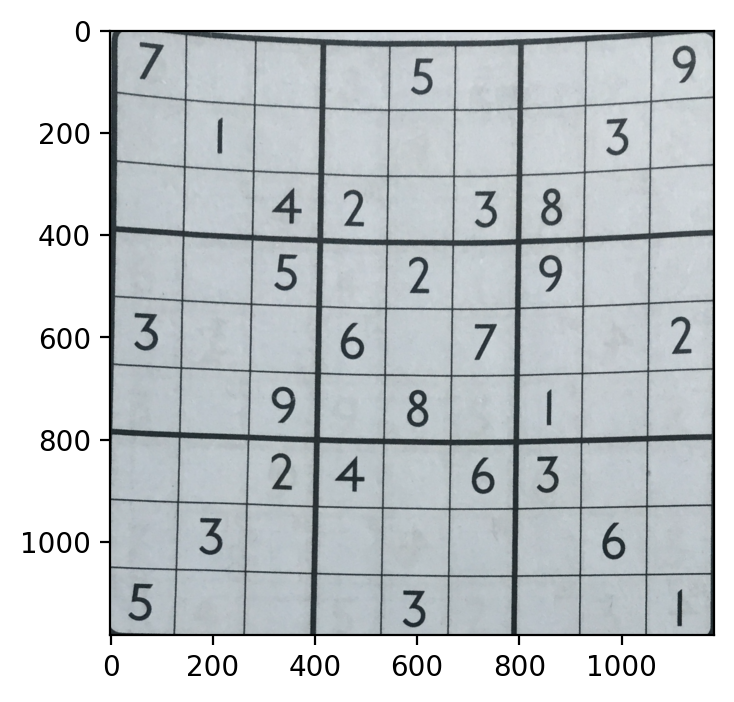

In [80]:
img_cnt, contours=mask(img)
cropped=crop(img, contours[0])

plt.figure(dpi=200)
plt.imshow(cropped)
plt.show()

In [101]:
x=predict_image(img)[1][0]
y=next(solve(temp))

In [150]:
cropped=crop(img, contours[0])
m, n=int(cropped.shape[0]/9), int(cropped.shape[1]/9)

font = cv2.FONT_HERSHEY_SIMPLEX
org = (60, 80)
fontScale = 2
color = (1, 1, 1)
thickness = 5

for i in range (1, 10):
  for j in range (1, 10): 
    if (x[i-1][j-1]==-1):
        insert=y[i-1][j-1]
        digit=cropped[(i-1)*m:i*m, (j-1)*n:j*n]
        cropped[(i-1)*m:i*m, (j-1)*n:j*n] = cv2.putText(digit, str(insert), org, font, 
                      fontScale, color, thickness, cv2.LINE_AA)
    
    


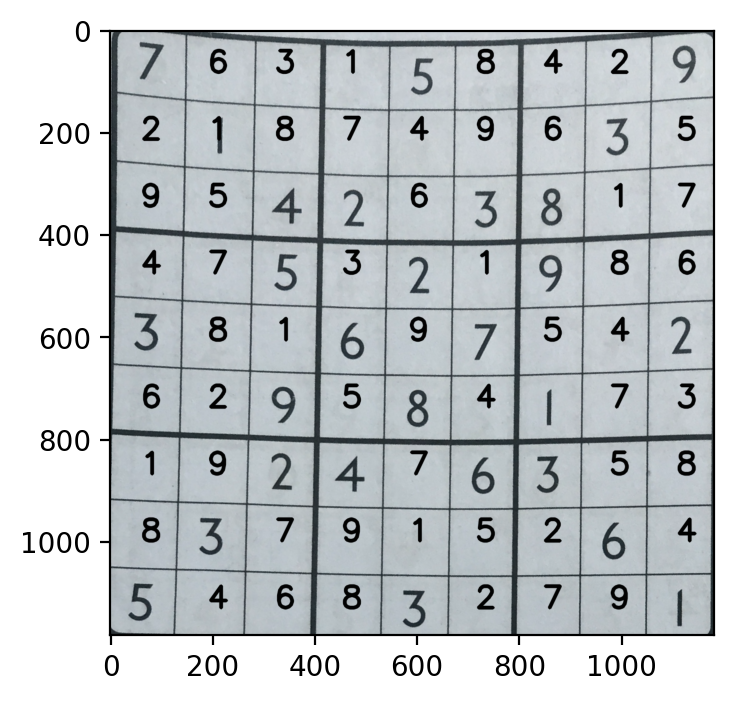

In [151]:
plt.figure(dpi=200)
plt.imshow(cropped)
plt.show()

In [152]:
def anti_crop(img, contour, cropped):
        def en(a=1): 
          return enumerate([pt[0][0]+a*pt[0][1] for pt in contour])
        def dist(p1, p2): 
          return np.sqrt(((p2[0] - p1[0]) ** 2) + ((p2[1] - p1[1]) ** 2))  
        
        tl=contour[min(en(1), key=operator.itemgetter(1))[0]][0]
        tr=contour[max(en(-1), key=operator.itemgetter(1))[0]][0]
        br=contour[max(en(1), key=operator.itemgetter(1))[0]][0]
        bl=contour[min(en(-1), key=operator.itemgetter(1))[0]][0]
        
        src = np.array([tl, tr, br, bl], dtype='float32')

        side = max([ dist(br, tr), dist(tl, bl), dist(br, bl), dist(tl, tr)])
        
        dst = np.array([[0, 0], 
                        [side - 1, 0], 
                        [side - 1, side - 1], 
                        [0, side - 1]], dtype='float32')
        m = cv2.getPerspectiveTransform(dst, src)
        result=cv2.warpPerspective(cropped, m, (int(img.shape[1]), int(img.shape[0])))
        for i in range(img.shape[0]-10):
          for j in range(img.shape[1]-10):
            if (result[i][j]==[0, 0, 0]).all(): result[i][j]=img[i][j]

        return result



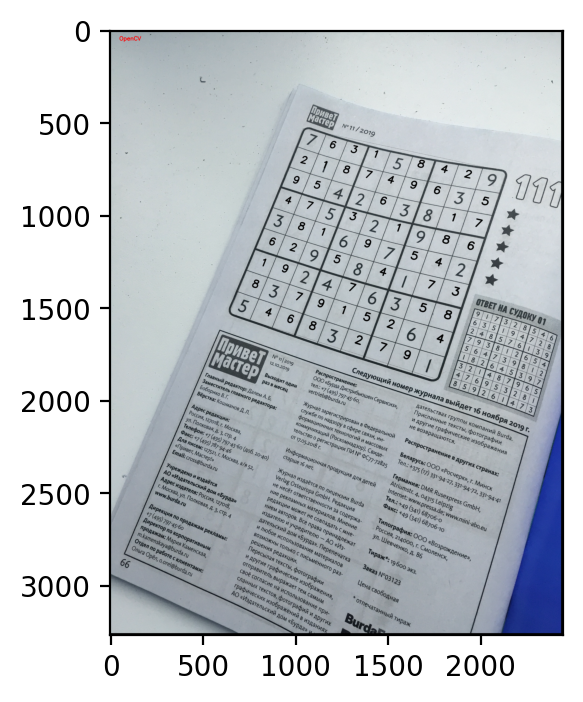

In [153]:
plt.figure(dpi=200)
plt.imshow(anti_crop(img, contours[0], cropped))
plt.show()